# Modelo Predador-Presa: Agentes vs Equações

Comparação entre:
1. **Modelo baseado em agentes** (simulação tipo "Jogo da Vida")
2. **Modelo de Lotka-Volterra** (equações diferenciais)

Ambos descrevem a mesma dinâmica, mas de perspectivas diferentes!

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.colors import ListedColormap
from scipy.integrate import odeint
from IPython.display import HTML
import random
%matplotlib inline

## Parte 1: Modelo Baseado em Agentes (OOP)

### Classes do Sistema

In [17]:
class Agente:
    """Classe base para agentes"""
    def __init__(self, x, y, energia):
        self.x = x
        self.y = y
        self.energia = energia
        self.vivo = True

    def mover(self, grid_size):
        """Move aleatoriamente para célula vizinha"""
        dx = random.choice([-1, 0, 1])
        dy = random.choice([-1, 0, 1])
        self.x = (self.x + dx) % grid_size
        self.y = (self.y + dy) % grid_size

    def morrer(self):
        self.vivo = False


class Presa(Agente):
    """Classe para presas (coelhos, etc)"""
    def __init__(self, x, y, energia=5):
        super().__init__(x, y, energia)
        self.taxa_reproducao = 0.08  # Alta taxa de reprodução

    def atualizar(self, grid_size):
        """Atualiza estado da presa"""
        self.mover(grid_size)
        # Sempre ganha energia (recursos abundantes)
        self.energia += 1

    def reproduzir(self):
        """Tenta reproduzir"""
        if self.energia > 8 and random.random() < self.taxa_reproducao:
            self.energia = 5
            return Presa(self.x, self.y, 5)
        return None


class Predador(Agente):
    """Classe para predadores (lobos, etc)"""
    def __init__(self, x, y, energia=15):
        super().__init__(x, y, energia)
        self.taxa_reproducao = 0.04
        self.energia_por_presa = 10
        self.raio_caca = 1  # Raio pequeno = menos eficiente

    def atualizar(self, grid_size):
        """Atualiza estado do predador"""
        self.mover(grid_size)
        self.energia -= 1  # Metabolismo
        if self.energia <= 0:
            self.morrer()

    def reproduzir(self):
        """Tenta reproduzir"""
        if self.energia > 20 and random.random() < self.taxa_reproducao:
            self.energia = 10
            return Predador(self.x, self.y, 10)
        return None

In [18]:
class Ambiente:
    """Classe que gerencia a simulação"""
    def __init__(self, tamanho=50, n_presas=100, n_predadores=20):
        self.tamanho = tamanho
        self.presas = []
        self.predadores = []
        self.historico_presas = []
        self.historico_predadores = []

        for _ in range(n_presas):
            x = random.randint(0, tamanho-1)
            y = random.randint(0, tamanho-1)
            self.presas.append(Presa(x, y))

        for _ in range(n_predadores):
            x = random.randint(0, tamanho-1)
            y = random.randint(0, tamanho-1)
            self.predadores.append(Predador(x, y))

    def _criar_grid_presas(self):
        """Hash map para busca espacial rápida"""
        grid = {}
        for presa in self.presas:
            if presa.vivo:
                key = (presa.x, presa.y)
                if key not in grid:
                    grid[key] = []
                grid[key].append(presa)
        return grid

    def passo(self):
        """Executa um passo da simulação"""
        # Atualiza presas
        novas_presas = []
        for presa in self.presas:
            if presa.vivo:
                presa.atualizar(self.tamanho)
                filhote = presa.reproduzir()
                if filhote:
                    novas_presas.append(filhote)

        # Grid espacial para caça
        grid_presas = self._criar_grid_presas()

        # Atualiza predadores
        novos_predadores = []
        for predador in self.predadores:
            if predador.vivo:
                predador.atualizar(self.tamanho)
                if predador.vivo:
                    self._cacar(predador, grid_presas)
                    filhote = predador.reproduzir()
                    if filhote:
                        novos_predadores.append(filhote)

        # Remove mortos e adiciona novos
        self.presas = [p for p in self.presas if p.vivo] + novas_presas
        self.predadores = [p for p in self.predadores if p.vivo] + novos_predadores

        self.historico_presas.append(len(self.presas))
        self.historico_predadores.append(len(self.predadores))

    def _cacar(self, predador, grid_presas):
        """Caça em células vizinhas"""
        raio = predador.raio_caca
        for dx in range(-raio, raio+1):
            for dy in range(-raio, raio+1):
                nx = (predador.x + dx) % self.tamanho
                ny = (predador.y + dy) % self.tamanho
                key = (nx, ny)
                if key in grid_presas:
                    for presa in grid_presas[key]:
                        if presa.vivo:
                            presa.morrer()
                            predador.energia += predador.energia_por_presa
                            return True
        return False

    def get_grid(self):
        grid = np.zeros((self.tamanho, self.tamanho))
        for presa in self.presas:
            if presa.vivo:
                grid[presa.y, presa.x] = 1
        for predador in self.predadores:
            if predador.vivo:
                grid[predador.y, predador.x] = 2
        return grid

    def simular(self, n_passos):
        for i in range(n_passos):
            self.passo()
            # Para se uma população for extinta
            if len(self.presas) == 0 or len(self.predadores) == 0:
                print(f"Extinção no passo {i}!")
                break
            # Limita população para evitar explosão de memória
            if len(self.presas) > 2000:
                self.presas = random.sample(self.presas, 1500)
            if len(self.predadores) > 500:
                self.predadores = random.sample(self.predadores, 400)

## Simulação e Visualização

In [19]:
# Parâmetros para comportamento cíclico
TAMANHO_GRID = 40
N_PRESAS_INICIAL = 80
N_PREDADORES_INICIAL = 25
N_PASSOS = 500

# Cria ambiente e simula
random.seed(42)
ambiente = Ambiente(TAMANHO_GRID, N_PRESAS_INICIAL, N_PREDADORES_INICIAL)
ambiente.simular(N_PASSOS)

print(f"Simulação finalizada!")
print(f"Presas finais: {len(ambiente.presas)}")
print(f"Predadores finais: {len(ambiente.predadores)}")

Extinção no passo 188!
Simulação finalizada!
Presas finais: 0
Predadores finais: 233


## Gráfico da Dinâmica Populacional (Agentes)

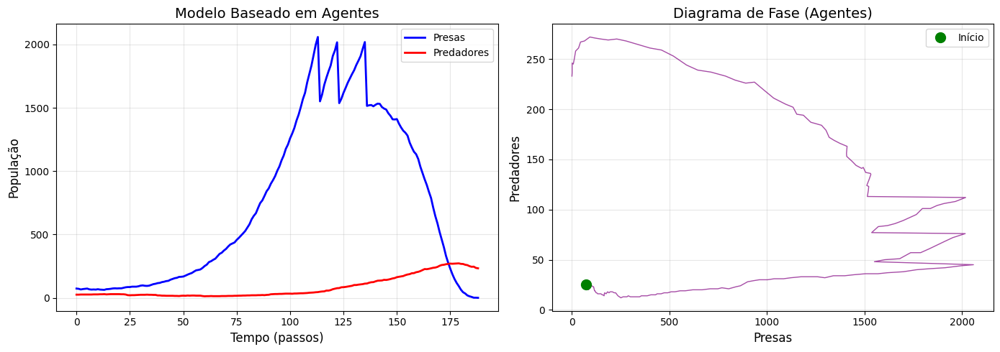

In [20]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Evolução temporal
t_agentes = range(len(ambiente.historico_presas))
ax1.plot(t_agentes, ambiente.historico_presas, 'b-', lw=2, label='Presas')
ax1.plot(t_agentes, ambiente.historico_predadores, 'r-', lw=2, label='Predadores')
ax1.set_xlabel('Tempo (passos)', fontsize=12)
ax1.set_ylabel('População', fontsize=12)
ax1.set_title('Modelo Baseado em Agentes', fontsize=14)
ax1.legend()
ax1.grid(True, alpha=0.3)

# Diagrama de fase
ax2.plot(ambiente.historico_presas, ambiente.historico_predadores, 'purple', lw=1, alpha=0.7)
ax2.plot(ambiente.historico_presas[0], ambiente.historico_predadores[0], 'go', ms=10, label='Início')
ax2.set_xlabel('Presas', fontsize=12)
ax2.set_ylabel('Predadores', fontsize=12)
ax2.set_title('Diagrama de Fase (Agentes)', fontsize=14)
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Parte 2: Modelo de Lotka-Volterra (EDOs)

Ajustamos os parâmetros para ter dinâmica similar ao modelo de agentes.

In [21]:
def lotka_volterra(u, t, alpha, beta, gamma, delta):
    x, y = u
    dx = alpha*x - beta*x*y
    dy = delta*x*y - gamma*y
    return [dx, dy]

# Parâmetros calibrados para escala similar
alpha = 0.1    # taxa de crescimento das presas  
beta = 0.005   # taxa de predação
gamma = 0.15   # taxa de mortalidade dos predadores
delta = 0.002  # eficiência de conversão

x0 = N_PRESAS_INICIAL
y0 = N_PREDADORES_INICIAL

t_lv = np.linspace(0, N_PASSOS, 1000)
sol_lv = odeint(lotka_volterra, [x0, y0], t_lv, args=(alpha, beta, gamma, delta))

print(f"Equilíbrio Lotka-Volterra: x* = {gamma/delta:.0f}, y* = {alpha/beta:.0f}")

Equilíbrio Lotka-Volterra: x* = 75, y* = 20


## Comparação: Agentes vs Lotka-Volterra

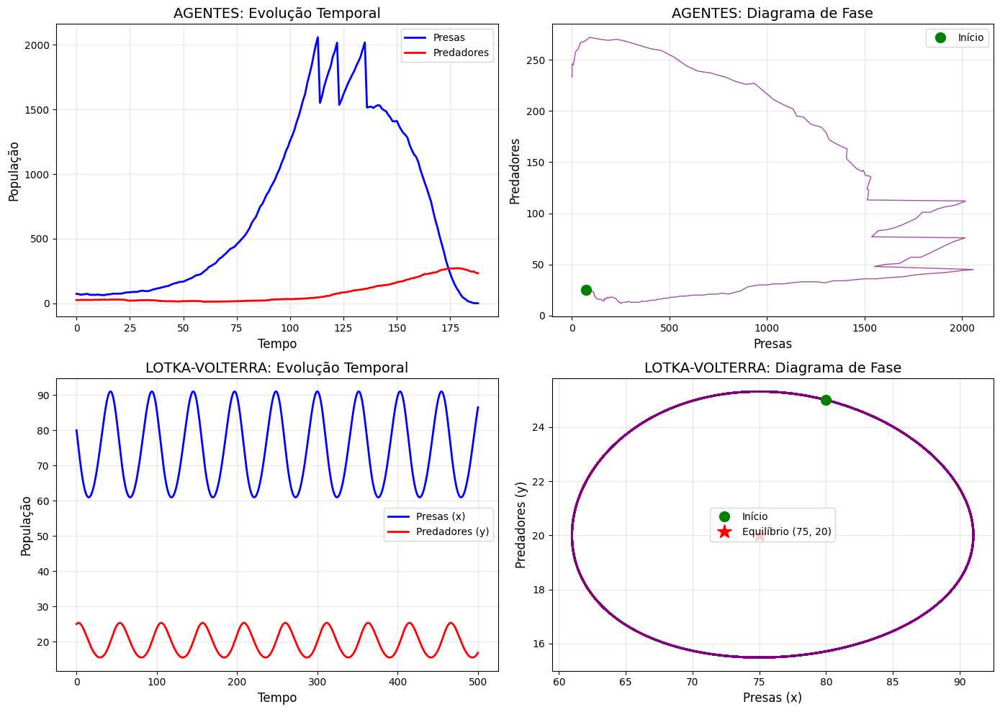

In [22]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# ===== Modelo de Agentes =====
ax1 = axes[0, 0]
ax1.plot(t_agentes, ambiente.historico_presas, 'b-', lw=2, label='Presas')
ax1.plot(t_agentes, ambiente.historico_predadores, 'r-', lw=2, label='Predadores')
ax1.set_xlabel('Tempo', fontsize=12)
ax1.set_ylabel('População', fontsize=12)
ax1.set_title('AGENTES: Evolução Temporal', fontsize=14)
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2 = axes[0, 1]
ax2.plot(ambiente.historico_presas, ambiente.historico_predadores, 'purple', lw=1, alpha=0.7)
ax2.plot(ambiente.historico_presas[0], ambiente.historico_predadores[0], 'go', ms=10, label='Início')
ax2.set_xlabel('Presas', fontsize=12)
ax2.set_ylabel('Predadores', fontsize=12)
ax2.set_title('AGENTES: Diagrama de Fase', fontsize=14)
ax2.legend()
ax2.grid(True, alpha=0.3)

# ===== Modelo de Lotka-Volterra =====
ax3 = axes[1, 0]
ax3.plot(t_lv, sol_lv[:, 0], 'b-', lw=2, label='Presas (x)')
ax3.plot(t_lv, sol_lv[:, 1], 'r-', lw=2, label='Predadores (y)')
ax3.set_xlabel('Tempo', fontsize=12)
ax3.set_ylabel('População', fontsize=12)
ax3.set_title('LOTKA-VOLTERRA: Evolução Temporal', fontsize=14)
ax3.legend()
ax3.grid(True, alpha=0.3)

ax4 = axes[1, 1]
ax4.plot(sol_lv[:, 0], sol_lv[:, 1], 'purple', lw=2)
ax4.plot(x0, y0, 'go', ms=10, label='Início')
x_eq = gamma / delta
y_eq = alpha / beta
ax4.plot(x_eq, y_eq, 'r*', ms=15, label=f'Equilíbrio ({x_eq:.0f}, {y_eq:.0f})')
ax4.set_xlabel('Presas (x)', fontsize=12)
ax4.set_ylabel('Predadores (y)', fontsize=12)
ax4.set_title('LOTKA-VOLTERRA: Diagrama de Fase', fontsize=14)
ax4.legend()
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Animação do Modelo de Agentes

Visualização em tempo real do grid!

In [23]:
# Animação
random.seed(42)
ambiente_anim = Ambiente(TAMANHO_GRID, N_PRESAS_INICIAL, N_PREDADORES_INICIAL)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
cmap = ListedColormap(['white', 'green', 'red'])

grid = ambiente_anim.get_grid()
im = ax1.imshow(grid, cmap=cmap, vmin=0, vmax=2)
ax1.set_title('Presas (verde) e Predadores (vermelho)')
ax1.axis('off')

linha_presas, = ax2.plot([], [], 'g-', lw=2, label='Presas')
linha_predadores, = ax2.plot([], [], 'r-', lw=2, label='Predadores')
ax2.set_xlim(0, 200)
ax2.set_ylim(0, 500)
ax2.set_xlabel('Tempo')
ax2.set_ylabel('População')
ax2.set_title('Dinâmica Populacional')
ax2.legend()
ax2.grid(True, alpha=0.3)

historico_p = []
historico_pred = []

def init():
    im.set_data(np.zeros((TAMANHO_GRID, TAMANHO_GRID)))
    linha_presas.set_data([], [])
    linha_predadores.set_data([], [])
    return im, linha_presas, linha_predadores

def animate(frame):
    ambiente_anim.passo()
    
    # Limita para não explodir
    if len(ambiente_anim.presas) > 1500:
        ambiente_anim.presas = random.sample(ambiente_anim.presas, 1200)
    
    im.set_data(ambiente_anim.get_grid())
    
    historico_p.append(len(ambiente_anim.presas))
    historico_pred.append(len(ambiente_anim.predadores))
    
    linha_presas.set_data(range(len(historico_p)), historico_p)
    linha_predadores.set_data(range(len(historico_pred)), historico_pred)
    
    if len(historico_p) > 200:
        ax2.set_xlim(0, len(historico_p))
    max_pop = max(max(historico_p[-50:], default=100), max(historico_pred[-50:], default=50)) * 1.2
    ax2.set_ylim(0, max(max_pop, 100))
    
    ax1.set_title(f't={frame+1}: {len(ambiente_anim.presas)} presas, {len(ambiente_anim.predadores)} pred.')
    return im, linha_presas, linha_predadores

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=200, interval=80, blit=True)
plt.close()
HTML(anim.to_jshtml())

## Comparação Teórica

### Modelo de Agentes (Bottom-Up)
- **Abordagem**: Simula cada indivíduo
- **Características**:
  - Estocasticidade intrínseca (ruído)
  - Pode haver extinção
  - Comportamento emergente
  - Espacialmente explícito

### Modelo de Lotka-Volterra (Top-Down)
- **Abordagem**: Descreve populações como um todo
- **Características**:
  - Determinístico
  - Órbitas fechadas (sem extinção)
  - Solução analítica possível
  - Não considera espaço

### Relação entre os modelos

O modelo de Lotka-Volterra pode ser derivado como **limite de campo médio** do modelo de agentes quando:
- $N \to \infty$ (muitos agentes)
- Mistura espacial perfeita

As taxas do Lotka-Volterra estão relacionadas às probabilidades do modelo de agentes:
- $\alpha \sim$ taxa de reprodução das presas
- $\beta \sim$ probabilidade de encontro × probabilidade de predação
- $\gamma \sim$ taxa de mortalidade dos predadores
- $\delta \sim$ eficiência de conversão de presa em energia

## Experimento: Variando Parâmetros

In [24]:
from ipywidgets import interact, IntSlider, FloatSlider

@interact(
    n_presas=IntSlider(min=40, max=150, step=10, value=80, description='Presas'),
    n_predadores=IntSlider(min=10, max=50, step=5, value=25, description='Predadores'),
    seed=IntSlider(min=1, max=100, value=42, description='Seed')
)
def comparar_modelos(n_presas, n_predadores, seed):
    # Modelo de agentes
    random.seed(seed)
    amb = Ambiente(40, n_presas, n_predadores)
    amb.simular(250)
    
    # Lotka-Volterra com parâmetros ajustados
    alpha, beta, gamma, delta = 0.1, 0.005, 0.15, 0.002
    t = np.linspace(0, 250, 500)
    sol = odeint(lotka_volterra, [n_presas, n_predadores], t, args=(alpha, beta, gamma, delta))
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    
    # Evolução temporal
    t_ag = range(len(amb.historico_presas))
    ax1.plot(t_ag, amb.historico_presas, 'b-', lw=2, alpha=0.8, label='Presas (agentes)')
    ax1.plot(t_ag, amb.historico_predadores, 'r-', lw=2, alpha=0.8, label='Predadores (agentes)')
    ax1.plot(t, sol[:, 0], 'b--', lw=2, alpha=0.6, label='Presas (LV)')
    ax1.plot(t, sol[:, 1], 'r--', lw=2, alpha=0.6, label='Predadores (LV)')
    ax1.set_xlabel('Tempo')
    ax1.set_ylabel('População')
    ax1.set_title('Agentes (sólido) vs Lotka-Volterra (tracejado)')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Diagrama de fase
    ax2.plot(amb.historico_presas, amb.historico_predadores, 'purple', lw=1.5, alpha=0.7, label='Agentes')
    ax2.plot(sol[:, 0], sol[:, 1], 'orange', lw=2, label='Lotka-Volterra')
    ax2.plot(n_presas, n_predadores, 'go', ms=10, label='Início')
    ax2.set_xlabel('Presas')
    ax2.set_ylabel('Predadores')
    ax2.set_title('Diagrama de Fase')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

interactive(children=(IntSlider(value=80, description='Presas', max=150, min=40, step=10), IntSlider(value=25,…

## Conclusão

| Aspecto | Agentes | Lotka-Volterra |
|---------|---------|----------------|
| **Tipo** | Estocástico | Determinístico |
| **Escala** | Microscópica | Macroscópica |
| **Espaço** | Explícito | Ignorado |
| **Extinção** | Possível | Impossível |
| **Ruído** | Natural | Ausente |
| **Computação** | Mais custosa | Mais eficiente |
| **Análise** | Numérica | Analítica possível |

Ambos os modelos capturam a **essência** da dinâmica predador-presa: oscilações defasadas nas populações. A escolha depende do que você quer estudar!